<a href="https://colab.research.google.com/github/nasarmientoo/diq_boston_crimes/blob/main/3_Project_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 3. Data Analysis

## Non Cleaned Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Initial dataset shape: (319073, 17)


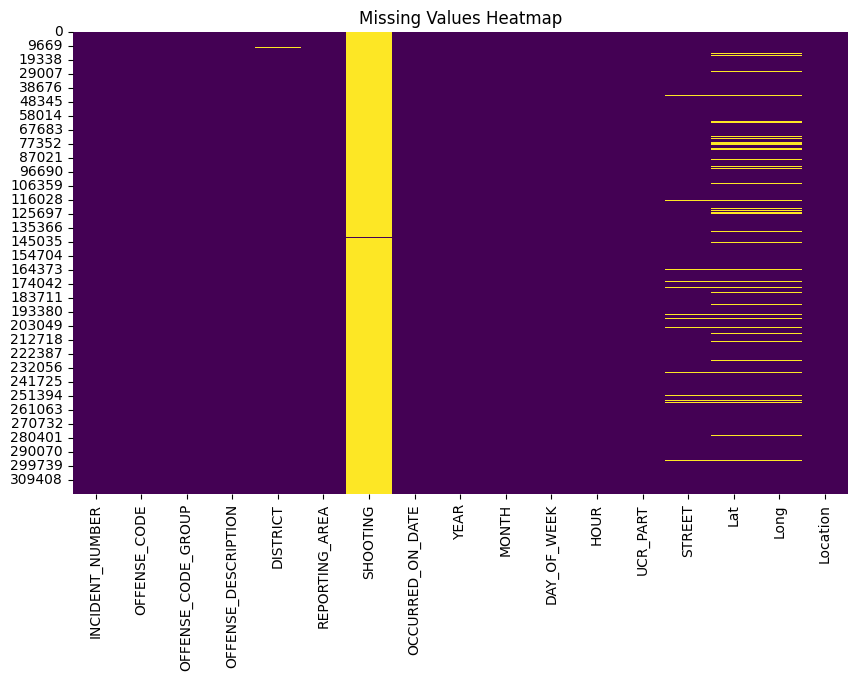

Dataset shape after removing NaN Lat/Long: (298329, 3)
Classification Report:
              precision    recall  f1-score   support

      Friday       0.18      0.20      0.19      9144
      Monday       0.18      0.17      0.17      8429
    Saturday       0.19      0.19      0.19      8379
      Sunday       0.18      0.15      0.16      7598
    Thursday       0.18      0.19      0.19      8759
     Tuesday       0.19      0.19      0.19      8539
   Wednesday       0.19      0.20      0.19      8818

    accuracy                           0.18     59666
   macro avg       0.18      0.18      0.18     59666
weighted avg       0.18      0.18      0.18     59666

Confusion Matrix:


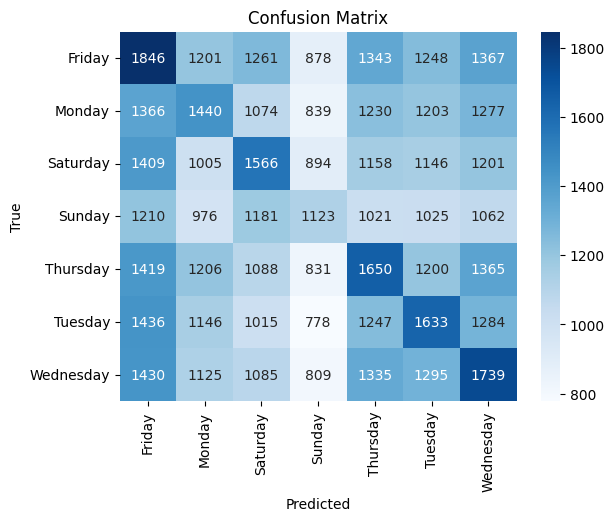

Accuracy: 0.18


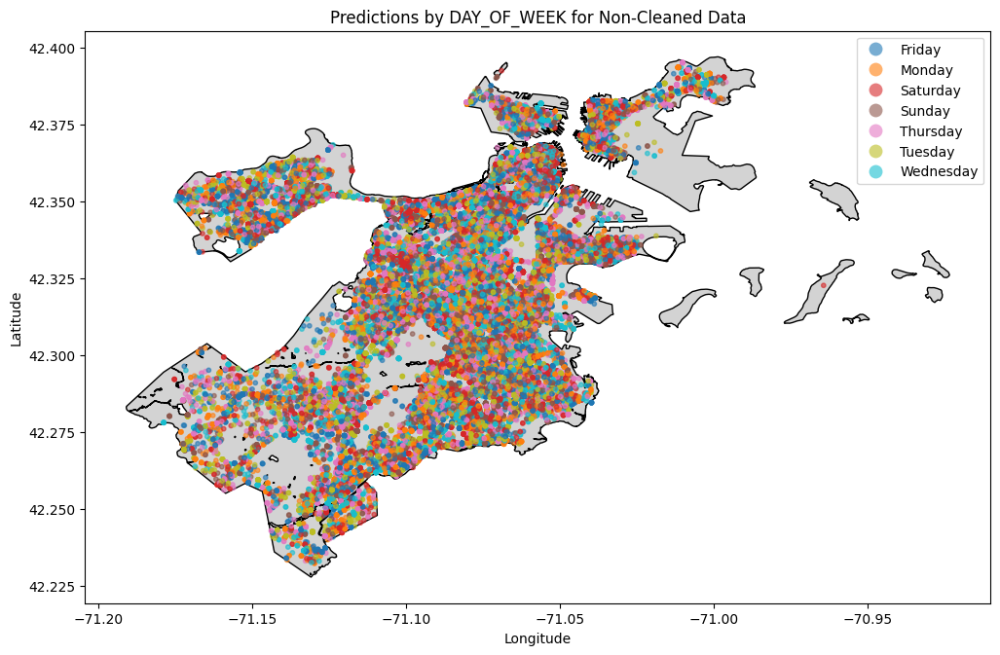

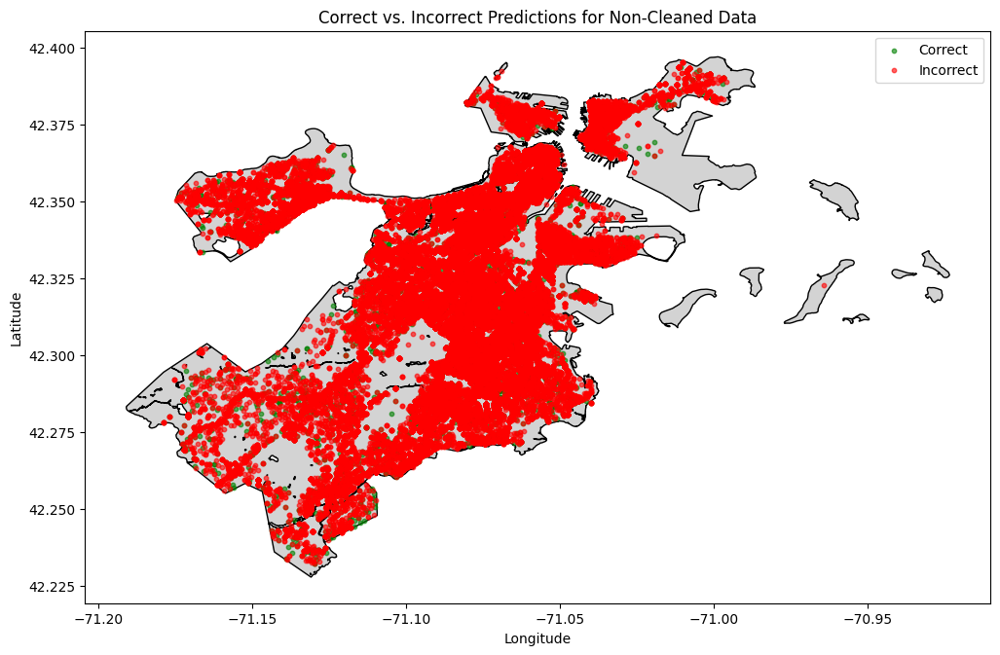

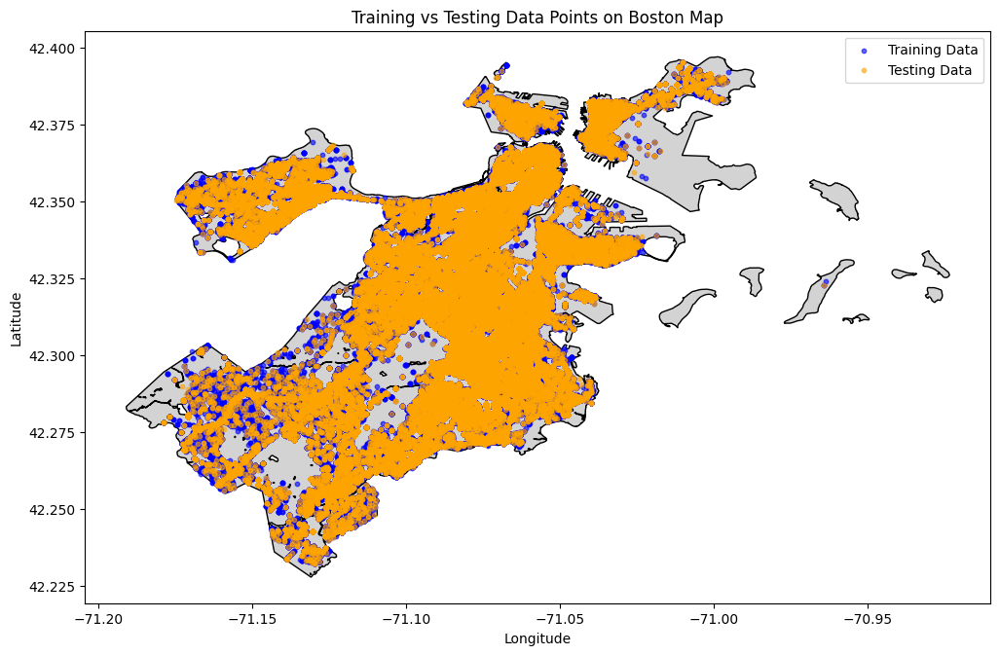

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import geopandas as gpd
from shapely.geometry import Point

# Load Data
file_path = '/content/drive/MyDrive/3rd Semester/Data and Information Quality/crime.csv'
data = pd.read_csv(file_path, encoding='unicode_escape')

# Check initial data shape
print(f"Initial dataset shape: {data.shape}")

# Visualize missing values in the dataset
plt.figure(figsize=(10, 6))
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

# Separate relevant columns (DAY_OF_WEEK, Lat, Lon)
data_relevant = data[['DAY_OF_WEEK', 'Lat', 'Long']]

# Remove rows with NaN values in Lat or Lon
data_relevant_cleaned = data_relevant.dropna(subset=['Lat', 'Long'])
data_relevant_cleaned = data_relevant_cleaned[(data_relevant_cleaned['Lat'] != -1.0) & (data_relevant_cleaned['Long'] != -1.0)]


# Check shape after cleaning NaN values
print(f"Dataset shape after removing NaN Lat/Long: {data_relevant_cleaned.shape}")

# Define features (X) and target (y)
X = data_relevant_cleaned[['Lat', 'Long']]
y = data_relevant_cleaned['DAY_OF_WEEK']

# Encode categorical target variable
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Train a RandomForestClassifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Performance Metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Accuracy Score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Add predictions to the dataset for plotting
X_test['Predicted_DAY_OF_WEEK'] = label_encoder.inverse_transform(y_pred)
X_test['True_DAY_OF_WEEK'] = label_encoder.inverse_transform(y_test)

# Load Boston boundaries shapefile
boston_boundaries = gpd.read_file('/content/drive/MyDrive/3rd Semester/Data and Information Quality/City_of_Boston_Outline_Boundary__Water_Excluded_.shp')

# Create GeoDataFrame for plotting
geometry = [Point(xy) for xy in zip(X_test['Long'], X_test['Lat'])]
geo_df = gpd.GeoDataFrame(X_test, geometry=geometry)

# Plot predictions by DAY_OF_WEEK
fig, ax = plt.subplots(figsize=(12, 12))
boston_boundaries.plot(ax=ax, color='lightgrey', edgecolor='black')
geo_df.plot(ax=ax, column='Predicted_DAY_OF_WEEK', legend=True, markersize=10, alpha=0.6)
plt.title("Predictions by DAY_OF_WEEK for Non-Cleaned Data")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Plot Correct vs. Incorrect Predictions
geo_df['Correct'] = geo_df['Predicted_DAY_OF_WEEK'] == geo_df['True_DAY_OF_WEEK']
fig, ax = plt.subplots(figsize=(12, 12))
boston_boundaries.plot(ax=ax, color='lightgrey', edgecolor='black')
geo_df[geo_df['Correct']].plot(ax=ax, color='green', markersize=10, label='Correct', alpha=0.6)
geo_df[~geo_df['Correct']].plot(ax=ax, color='red', markersize=10, label='Incorrect', alpha=0.6)
plt.legend()
plt.title("Correct vs. Incorrect Predictions for Non-Cleaned Data")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Create GeoDataFrames for training and testing sets
geometry_train = [Point(xy) for xy in zip(X_train['Long'], X_train['Lat'])]
geometry_test = [Point(xy) for xy in zip(X_test['Long'], X_test['Lat'])]

geo_train = gpd.GeoDataFrame(X_train, geometry=geometry_train)
geo_test = gpd.GeoDataFrame(X_test, geometry=geometry_test)

# Plot training and testing points on the Boston map
fig, ax = plt.subplots(figsize=(12, 12))
boston_boundaries.plot(ax=ax, color='lightgrey', edgecolor='black')
geo_train.plot(ax=ax, color='blue', markersize=10, label='Training Data', alpha=0.6)
geo_test.plot(ax=ax, color='orange', markersize=10, label='Testing Data', alpha=0.6)
plt.legend()
plt.title("Training vs Testing Data Points on Boston Map")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


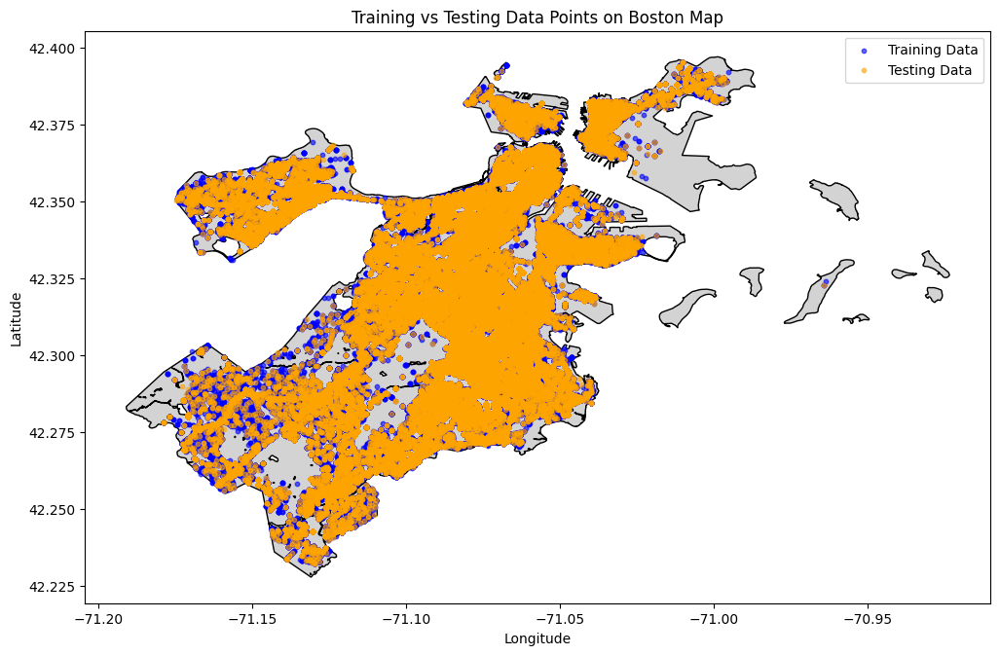

## Cleaned Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Initial dataset shape: (319050, 15)


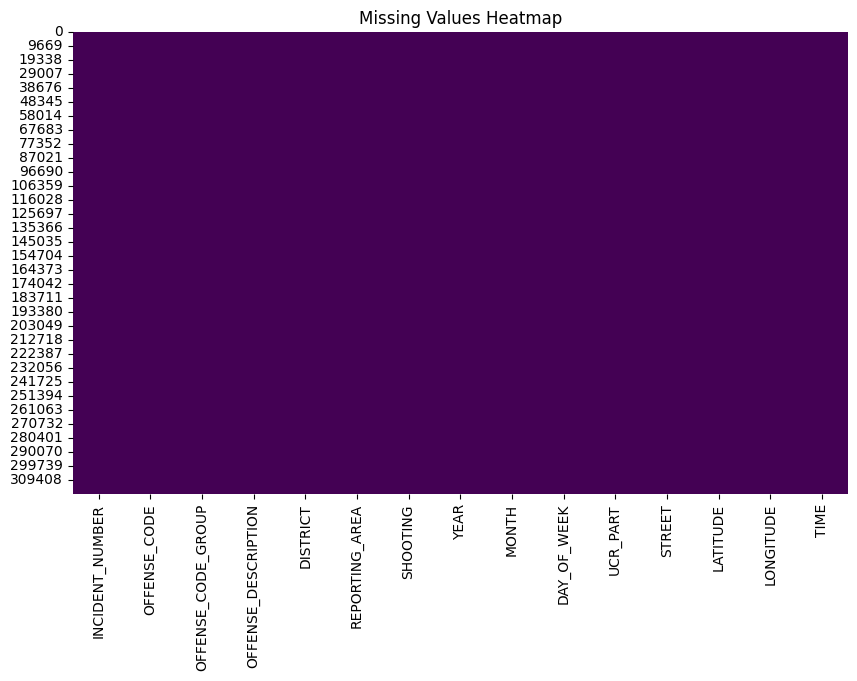

Classification Report:
              precision    recall  f1-score   support

      Friday       0.18      0.19      0.19      9631
      Monday       0.19      0.16      0.18      9114
    Saturday       0.19      0.18      0.18      9070
      Sunday       0.19      0.15      0.17      8246
    Thursday       0.18      0.17      0.18      9324
     Tuesday       0.17      0.24      0.20      9197
   Wednesday       0.17      0.17      0.17      9228

    accuracy                           0.18     63810
   macro avg       0.18      0.18      0.18     63810
weighted avg       0.18      0.18      0.18     63810

Confusion Matrix:


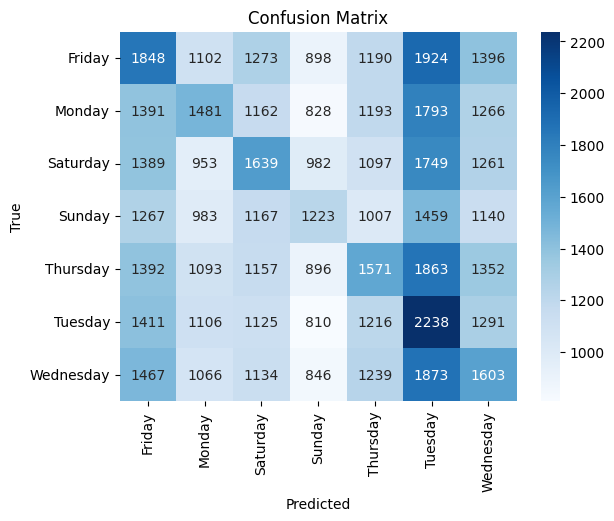

Accuracy: 0.18


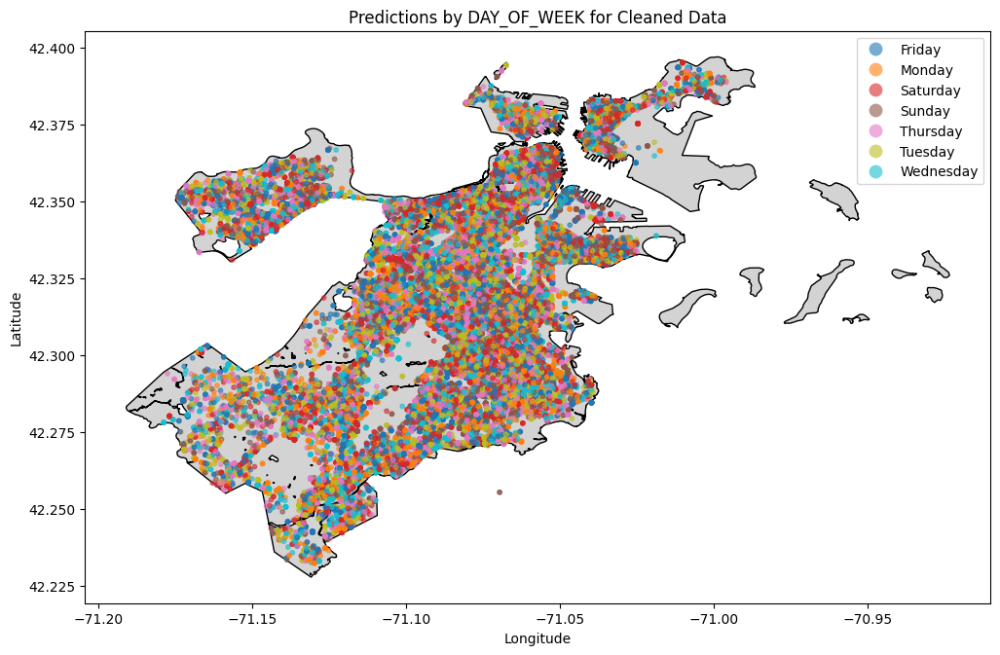

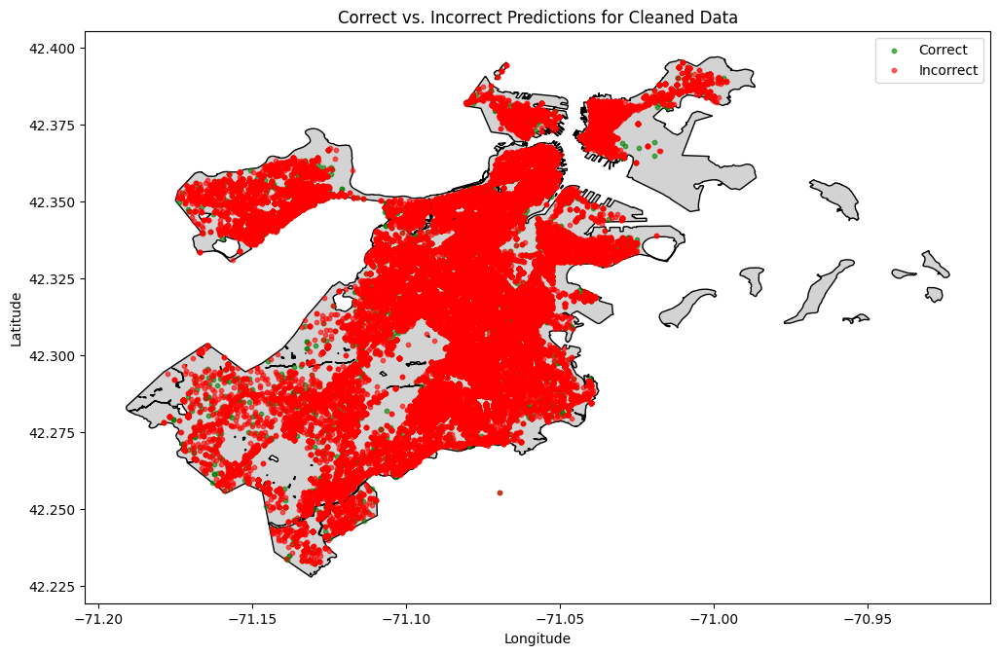

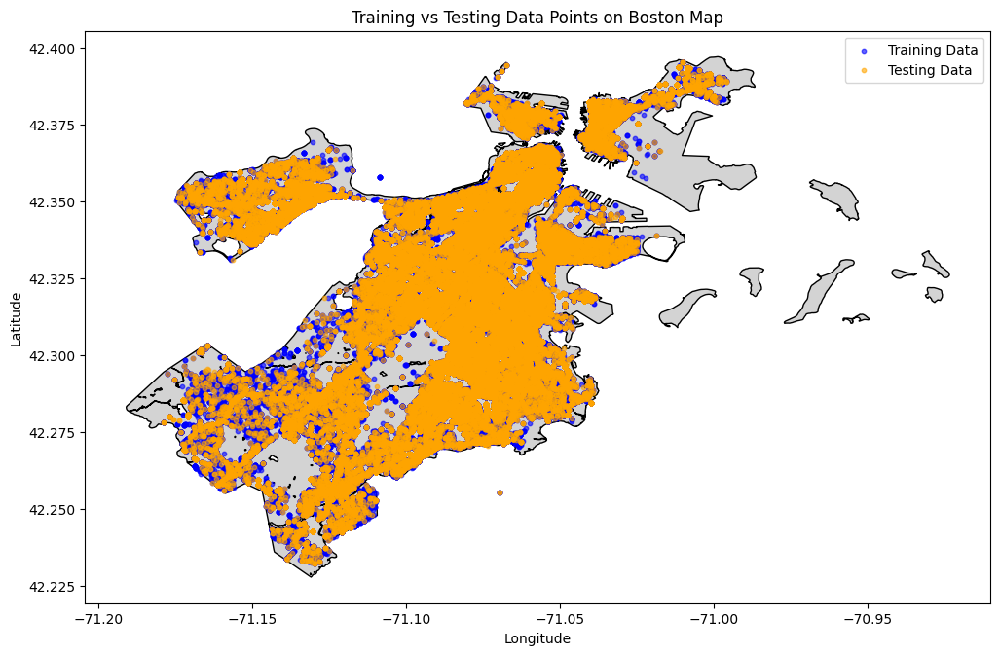

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import geopandas as gpd
from shapely.geometry import Point

# Load Data
file_path = '/content/drive/MyDrive/3rd Semester/Data and Information Quality/cleaned_crimes_1.csv'
data = pd.read_csv(file_path, encoding='unicode_escape')

# Check initial data shape
print(f"Initial dataset shape: {data.shape}")

# Visualize missing values in the dataset
plt.figure(figsize=(10, 6))
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()


# Separate relevant columns (DAY_OF_WEEK, Lat, Lon)
data_relevant = data[['DAY_OF_WEEK', 'LATITUDE', 'LONGITUDE']]

# Remove rows with NaN values in Lat or Lon
#data_relevant_cleaned = data_relevant.dropna(subset=['LATITUDE', 'LONGITUDE'])
#data_relevant_cleaned = data_relevant_cleaned[(data_relevant_cleaned['LATITUDE'] != -1.0) & (data_relevant_cleaned['LONGITUDE'] != -1.0)]


# Check shape after cleaning NaN values
#print(f"Dataset shape after removing NaN Lat/Long: {data_relevant_cleaned.shape}")

# Define features (X) and target (y)
X = data_relevant[['LATITUDE', 'LONGITUDE']]
y = data_relevant['DAY_OF_WEEK']

# Encode categorical target variable
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Train a RandomForestClassifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Performance Metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Accuracy Score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Add predictions to the dataset for plotting
X_test['Predicted_DAY_OF_WEEK'] = label_encoder.inverse_transform(y_pred)
X_test['True_DAY_OF_WEEK'] = label_encoder.inverse_transform(y_test)

# Load Boston boundaries shapefile
boston_boundaries = gpd.read_file('/content/drive/MyDrive/3rd Semester/Data and Information Quality/City_of_Boston_Outline_Boundary__Water_Excluded_.shp')

# Create GeoDataFrame for plotting
geometry = [Point(xy) for xy in zip(X_test['LONGITUDE'], X_test['LATITUDE'])]
geo_df = gpd.GeoDataFrame(X_test, geometry=geometry)

# Plot predictions by DAY_OF_WEEK
fig, ax = plt.subplots(figsize=(12, 12))
boston_boundaries.plot(ax=ax, color='lightgrey', edgecolor='black')
geo_df.plot(ax=ax, column='Predicted_DAY_OF_WEEK', legend=True, markersize=10, alpha=0.6)
plt.title("Predictions by DAY_OF_WEEK for Cleaned Data")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Plot Correct vs. Incorrect Predictions
geo_df['Correct'] = geo_df['Predicted_DAY_OF_WEEK'] == geo_df['True_DAY_OF_WEEK']
fig, ax = plt.subplots(figsize=(12, 12))
boston_boundaries.plot(ax=ax, color='lightgrey', edgecolor='black')
geo_df[geo_df['Correct']].plot(ax=ax, color='green', markersize=10, label='Correct', alpha=0.6)
geo_df[~geo_df['Correct']].plot(ax=ax, color='red', markersize=10, label='Incorrect', alpha=0.6)
plt.legend()
plt.title("Correct vs. Incorrect Predictions for Cleaned Data")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Create GeoDataFrames for training and testing sets
geometry_train = [Point(xy) for xy in zip(X_train['LONGITUDE'], X_train['LATITUDE'])]
geometry_test = [Point(xy) for xy in zip(X_test['LONGITUDE'], X_test['LATITUDE'])]

geo_train = gpd.GeoDataFrame(X_train, geometry=geometry_train)
geo_test = gpd.GeoDataFrame(X_test, geometry=geometry_test)

# Plot training and testing points on the Boston map
fig, ax = plt.subplots(figsize=(12, 12))
boston_boundaries.plot(ax=ax, color='lightgrey', edgecolor='black')
geo_train.plot(ax=ax, color='blue', markersize=10, label='Training Data', alpha=0.6)
geo_test.plot(ax=ax, color='orange', markersize=10, label='Testing Data', alpha=0.6)
plt.legend()
plt.title("Training vs Testing Data Points on Boston Map")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [ ]:
# Count NaN and -1 values in Latitude and Longitude
nan_lat = data['LATITUDE'].isna().sum()
nan_long = data['LONGITUDE'].isna().sum()
invalid_lat = (data['LATITUDE'] == -1.0).sum()
invalid_long = (data['LONGITUDE'] == -1.0).sum()

print(f"\nNaN values in LATITUDE: {nan_lat}")
print(f"NaN values in LONGITUDE: {nan_long}")
print(f"Invalid (-1) values in LATITUDE: {invalid_lat}")
print(f"Invalid (-1) values in LONGITUDE: {invalid_long}")


NaN values in LATITUDE: 9851
NaN values in LONGITUDE: 9851
Invalid (-1) values in LATITUDE: 884
Invalid (-1) values in LONGITUDE: 884


In [ ]:

# Display the dataset as a scrollable table
from IPython.display import display
from google.colab.data_table import DataTable

# Use DataTable for an interactive scrollable table
DataTable(data)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,YEAR,MONTH,DAY_OF_WEEK,UCR_PART,STREET,LATITUDE,LONGITUDE,TIME
0,I182070945,619,LARCENY,LARCENY ALL OTHERS,D14,808,NAN,2018.0,9.0,Sunday,PART ONE,LINCOLN ST,42.357791,-71.139371,13:00
1,I182070943,1402,VANDALISM,VANDALISM,C11,347,NAN,2018.0,8.0,Tuesday,PART TWO,HECLA ST,42.306821,-71.060300,00:00
2,I182070941,3410,TOWED,TOWED MOTOR VEHICLE,D4,151,NAN,2018.0,9.0,Monday,PART THREE,CAZENOVE ST,42.346589,-71.072429,19:27
3,I182070940,3114,INVESTIGATE PROPERTY,INVESTIGATE PROPERTY,D4,272,NAN,2018.0,9.0,Monday,PART THREE,NEWCOMB ST,42.334182,-71.078664,21:16
4,I182070938,3114,INVESTIGATE PROPERTY,INVESTIGATE PROPERTY,B3,421,NAN,2018.0,9.0,Monday,PART THREE,DELHI ST,42.275365,-71.090361,21:05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319045,I050310906-00,3125,WARRANT ARRESTS,WARRANT ARREST,D4,285,NAN,2016.0,6.0,Sunday,PART THREE,COVENTRY ST,42.336951,-71.085748,17:25
319046,I030217815-08,111,HOMICIDE,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NAN,2015.0,7.0,Thursday,PART ONE,RIVER ST,42.255926,-71.123172,13:38
319047,I030217815-08,3125,WARRANT ARRESTS,WARRANT ARREST,E18,520,NAN,2015.0,7.0,Thursday,PART THREE,RIVER ST,42.255926,-71.123172,13:38
319048,I010370257-00,3125,WARRANT ARRESTS,WARRANT ARREST,E13,569,NAN,2016.0,5.0,Tuesday,PART THREE,NEW WASHINGTON ST,42.302333,-71.111565,19:35
